In [176]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from mplsoccer import Pitch
from ast import literal_eval
from matplotlib.patches import Polygon
import matplotlib.animation as animation
rdf_path = Path("/home/lz80/rdf/sp161/shared/asi_gk_pos/data")
test_game = 1448682

In [76]:
test_tracking = pd.read_csv(rdf_path / "tracking" / f"{test_game}_tracking.csv")
metadata = pd.read_csv(rdf_path / f"matches_meta.csv")

In [101]:
def get_players(game, metadata):
    game_meta = metadata[metadata['id'] == game].iloc[0]
    players = literal_eval(game_meta['players'])
    home_players = [p['id'] for p in players if p['team_id'] == literal_eval(game_meta['home_team'])['id']]
    away_players = [p['id'] for p in players if p['team_id'] == literal_eval(game_meta['away_team'])['id']]
    return home_players, away_players   

In [226]:
def plot_objects(pitch, ax, tracking, frame, home_players=None):
    frame_data = tracking[tracking['frame'] == frame].iloc[0]
    image_corners = literal_eval(frame_data['image_corners_projection'])
    verts = [
        (image_corners['x_top_left'], image_corners['y_top_left']),
        (image_corners['x_top_right'], image_corners['y_top_right']),
        (image_corners['x_bottom_right'], image_corners['y_bottom_right']),
        (image_corners['x_bottom_left'], image_corners['y_bottom_left'])
    ]
    poly = Polygon(verts, closed=True, fill=True, linewidth=2, alpha= 0.6, color = "gray", label='Camera View')
    ax.add_patch(poly)
    players = literal_eval(frame_data['player_data'])
    ball = literal_eval(frame_data['ball_data'])
    possession = literal_eval(frame_data['possession'])
    posession_group = possession['group']
    possession_player_id = possession['player_id']
    if home_players is not None:
        home_player_x = [p['x'] for p in players if p['player_id'] in home_players]
        home_player_y = [p['y'] for p in players if p['player_id'] in home_players]
        away_player_x = [p['x'] for p in players if p['player_id'] not in home_players]
        away_player_y = [p['y'] for p in players if p['player_id'] not in home_players]

        if posession_group == 'away team':
            pitch.scatter(home_player_x, home_player_y, ax=ax, marker = 'x', c='red', label='Home', s=50)
            pitch.scatter(away_player_x, away_player_y, ax=ax, marker = 'o', edgecolors ='blue', facecolors = 'none', label='Away', s=50)

        else:   
            pitch.scatter(home_player_x, home_player_y, ax=ax, marker = 'o', edgecolors ='blue', facecolors = 'none', label='Home', s=50)
            pitch.scatter(away_player_x, away_player_y, ax=ax, marker = 'x', c='red', label='Away', s=50)
    else:
        player_x = [p['x'] for p in players]
        player_y = [p['y'] for p in players]
        pitch.scatter(player_x, player_y, ax=ax, c='blue', s=50)
    if possession_player_id is not None:
        poss_player = [p for p in players if p['player_id'] == possession_player_id][0]
        pitch.scatter(poss_player['x'], poss_player['y'], ax=ax, edgecolors='green',facecolors = 'none', s=50, label='Possession')

    pitch.scatter(ball['x'], ball['y'], ax=ax, c='black', label='Ball', s=50)
    return {
        'frame': frame,
        'period': frame_data['period'],
        'timestamp': frame_data['timestamp'],
        'possession_player_id': possession_player_id,
        'possession_group': posession_group
    }

def plot_gamestate(tracking, frame, home_players=None):
    pitch = Pitch(pitch_type='skillcorner', pitch_length = 105, pitch_width = 68) 
    fig, ax = pitch.draw()
    meta = plot_objects(pitch, ax, tracking, frame, home_players)
    plt.suptitle(f'Game State at Frame {frame}', y=1.05, fontsize=14)
    plt.title(f'Time {meta["timestamp"]}s, period {meta["period"]}, Possession: {meta["possession_group"]}, {meta["possession_player_id"]}', fontsize=10)
    plt.legend()
    plt.show()

def animate_gamestate(tracking, frames, home_players=None):
    pitch = Pitch(pitch_type='skillcorner', pitch_length = 105, pitch_width = 68) 
    fig, ax = pitch.draw()
    def update(i):
        frame = frames[i]
        ax.clear()
        pitch.draw(ax=ax)
        meta = plot_objects(pitch, ax, tracking, frame, home_players)
        plt.suptitle(f'Time {meta["timestamp"]}s, period {meta["period"]}, Possession: {meta["possession_group"]}, {meta["possession_player_id"]} \n Game State at Frame {frame}', fontsize=14)
        plt.legend()
    ani = animation.FuncAnimation(fig, update, len(frames), interval=20, blit=False)
    return ani

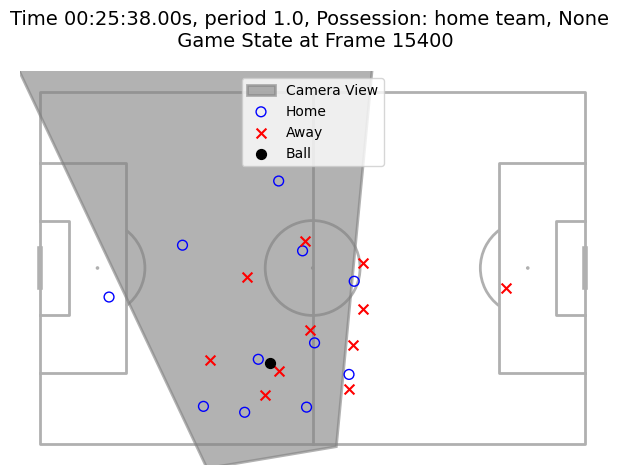

In [227]:
from IPython.display import HTML
anim = animate_gamestate(test_tracking, frames = range(15400,15450), home_players=get_players(test_game, metadata)[0])
anim
HTML(anim.to_jshtml())

In [ ]:
def animate_gamestates_dropin(tracking, frames, home_players=None, fps=10, save_path=None, format="gif"):
    imgs = []
    for f in frames:
        # Call your function; it will create/close its own fig via plt.show()
        plot_gamestate(tracking, f, home_players=home_players)

        # Grab the current figure's canvas as an RGBA image
        buf = io.BytesIO()
        plt.gcf().savefig(buf, format='png', bbox_inches='tight', dpi=120)
        buf.seek(0)
        imgs.append(Image.open(buf).convert("RGB"))
        plt.close()  # close to avoid piling up figures